In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams["figure.figsize"] = (15, 10)
plt.rcParams["figure.dpi"] = 125
plt.rcParams["font.size"] = 14
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.style.use('ggplot')
sns.set_style("whitegrid", {'axes.grid': False})
plt.rcParams['image.cmap'] = 'gray' # grayscale looks better

In [4]:
from pathlib import Path
import numpy as np
import pandas as pd
import os
from skimage.io import imread as imread
from skimage.util import montage
from PIL import Image
montage_rgb = lambda x: np.stack([montage(x[:, :, :, i]) for i in range(x.shape[3])], -1)
from skimage.color import label2rgb
base_dir = Path('..')
image_dir = Path('..') / 'recipe'
alleg_df = pd.read_json('clean_list.json')

In [5]:
alleg_df['image_path'] = alleg_df['image_path'].map(lambda x: image_dir / 'subset' / x) 
print(alleg_df['image_path'].map(lambda x: x.exists()).value_counts())
allergens = alleg_df.columns[3:].tolist()
alleg_df.sample(2)

True    9653
Name: image_path, dtype: int64


,image_path,title,ingredients_list,cows milk,eggs,tree nuts,peanuts,shellfish,wheat,soy,fish
7685,..\recipe\subset\caeabd196d.jpg,Sukiyaki-style Simmered Vegetables and Beef,"[250 grams Beef, 1/4 Chinese cabbage, 6 Shiita...",0,0,0,0,0,1,2,0
8455,..\recipe\subset\e056155cb0.jpg,Basic Quiche,"[1 Sheet Puff Pastry, Thawed, 4 Eggs, 1- 1/2 c...",2,0,0,0,0,0,0,0


In [6]:
color_file = 'color_features.json'
color_feat_df = pd.read_json(color_file)
color_feat_df['image_path'] = color_feat_df['image_path'].map(lambda x: image_dir / 'subset' / x) 

color_feat_dict = {c_row['image_path']: c_row['color_features'] for _, c_row in color_feat_df.iterrows()}
# adding a new color feature column
alleg_df['color_features'] = alleg_df['image_path'].map(color_feat_dict.get)
alleg_df.sample(2)

,image_path,title,ingredients_list,cows milk,eggs,tree nuts,peanuts,shellfish,wheat,soy,fish,color_features
8395,..\recipe\subset\dec0ac1696.jpg,Burrito casserole,"[1 lb ground beef, 1/2 onion, chopped, 1 1/4 t...",3,0,0,0,0,1,0,0,"[0.14151670930000002, 0.0, 0.0, 0.0, 0.0, 0.0,..."
7334,..\recipe\subset\c1cd09670d.jpg,*White Chocolate Macadamia Cookies With Coconut*,"[2 cup all-purpose flour, 1 tsp baking soda, 1...",1,0,1,0,0,1,0,0,"[0.001839857, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...."


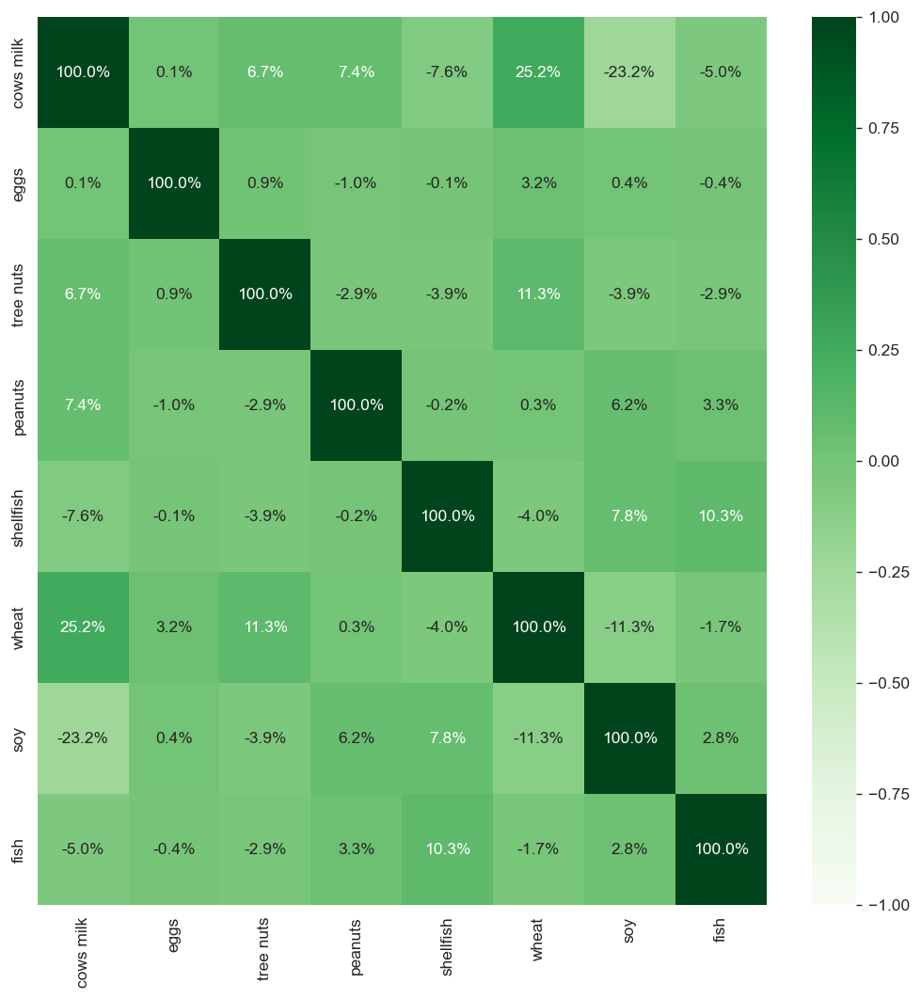

In [7]:
co_all = np.corrcoef(np.stack(alleg_df[allergens].applymap(lambda x: 1 if x>0 else 0).values, 0).T)
fig, ax1 = plt.subplots(1, 1, figsize=(10, 10))
sns.heatmap(co_all, annot=True, fmt='2.1%', ax=ax1, cmap='Greens', vmin=-1, vmax=1)
ax1.set_xticklabels(allergens, rotation=90)
ax1.set_yticklabels(allergens);

In [8]:
# package the allergens together
alleg_df['allergy_vec'] = alleg_df[allergens].applymap(lambda x: 1 if x>0 else 0).values.tolist()

In [9]:
from sklearn.model_selection import train_test_split
train_df, valid_df = train_test_split(alleg_df.drop('ingredients_list', 1), 
                 test_size = 0.2, 
                 random_state=2019,
                  # hack to make stratification work                  
                 stratify = alleg_df['allergy_vec'].map(lambda x: x[0:3]))
train_df.reset_index(inplace=True)
valid_df.reset_index(inplace=True)
print(train_df.shape[0], 'training images')
print(valid_df.shape[0], 'validation images')

7722 training images
1931 validation images


C:\Users\Nathamayil\AppData\Local\Temp\ipykernel_22404\1359571259.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  train_df, valid_df = train_test_split(alleg_df.drop('ingredients_list', 1),


In [10]:
train_x_vec = np.stack(train_df['color_features'].values, 0)
train_y_vec = np.stack(train_df['allergy_vec'], 0)
print(train_x_vec.shape, '->', train_y_vec.shape)
valid_x_vec = np.stack(valid_df['color_features'].values, 0)
valid_y_vec = np.stack(valid_df['allergy_vec'], 0)
print(valid_x_vec.shape, '->', valid_y_vec.shape)

(7722, 255) -> (7722, 8)
(1931, 255) -> (1931, 8)


In [11]:
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score
def show_model_results(in_model, use_split='valid', plot_type='strip'):
    if use_split=='valid':
        x_vec = valid_x_vec
        y_vec = valid_y_vec
        example_df = valid_df
    elif use_split=='train':
        x_vec = train_x_vec
        y_vec = train_y_vec
        example_df = train_df
    else:
        raise ValueError('Unknown split: {}'.format(use_split))
    
    valid_pred = in_model.predict(x_vec)
    fig, m_axs = plt.subplots(4, 2, figsize=(20, 40))
    all_rows = []
    ax1 = m_axs[0,0]
    for i, c_allergen in enumerate(allergens):
        tpr, fpr, _ = roc_curve(y_vec[:, i], valid_pred[:, i])
        auc = roc_auc_score(y_vec[:, i], valid_pred[:, i])
        acc = accuracy_score(y_vec[:, i], valid_pred[:, i]>0.5)
        ax1.plot(tpr, fpr, '.-', label='{}: AUC {:0.2f}, Accuracy: {:2.0%}'.format(c_allergen, auc, acc))
        all_rows+=[{'allegen': c_allergen, 
                    'prediction': valid_pred[j, i], 
                    'class': 'Positive' if y_vec[j, i]>0.5 else 'Negative'} 
                         for j in range(valid_pred.shape[0])]
    
    d_ax = m_axs[0, 1]
    t_yp = np.mean(valid_pred, 0)
    t_y = np.mean(y_vec, 0)
    d_ax.barh(np.arange(len(allergens))+0.1, t_yp, alpha=0.5, label='Predicted')
    d_ax.barh(np.arange(len(allergens))-0.1, t_y+0.001, alpha=0.5, label='Ground Truth')
    d_ax.set_xlim(0, 1)
    d_ax.set_yticks(range(len(allergens)))
    d_ax.set_yticklabels(allergens, rotation=0)
    d_ax.set_title('Overall')
    d_ax.legend()
    
    # show example images
    ax1.legend()
    for (_, c_row), (c_ax, d_ax) in zip(
        example_df.sample(m_axs.shape[0]).iterrows(), 
                               m_axs[1:]):
        
        c_ax.imshow(imread(c_row['image_path']))
        c_ax.set_title(c_row['title'])
        c_ax.axis('off')
        t_yp = in_model.predict(np.expand_dims(c_row['color_features'], 0))
        t_y = np.array(c_row['allergy_vec'])
        d_ax.barh(np.arange(len(allergens))+0.1, t_yp[0], alpha=0.5, label='Predicted')
        d_ax.barh(np.arange(len(allergens))-0.1, t_y+0.001, alpha=0.5, label='Ground Truth')
        d_ax.set_yticks(range(len(allergens)))
        d_ax.set_yticklabels(allergens, rotation=0)
        d_ax.set_xlim(0, 1)
        d_ax.legend();
    
    # nice dataframe of output
    c_all_df = pd.DataFrame(all_rows)
    fig, ax1 = plt.subplots(1, 1, figsize=(12, 5))
    if plot_type=='strip':
        sns.stripplot(data=c_all_df, hue='class', y='prediction', x='allegen', size=2.0, ax=ax1)
    elif plot_type=='box':
        sns.boxplot(data=c_all_df, hue='class', y='prediction', x='allegen', ax=ax1)
    ax1.set_ylim(-0.05, 1.05)
    return c_all_df

In [12]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors=1)
knn.fit(train_x_vec, train_y_vec)

KNeighborsRegressor(n_neighbors=1)

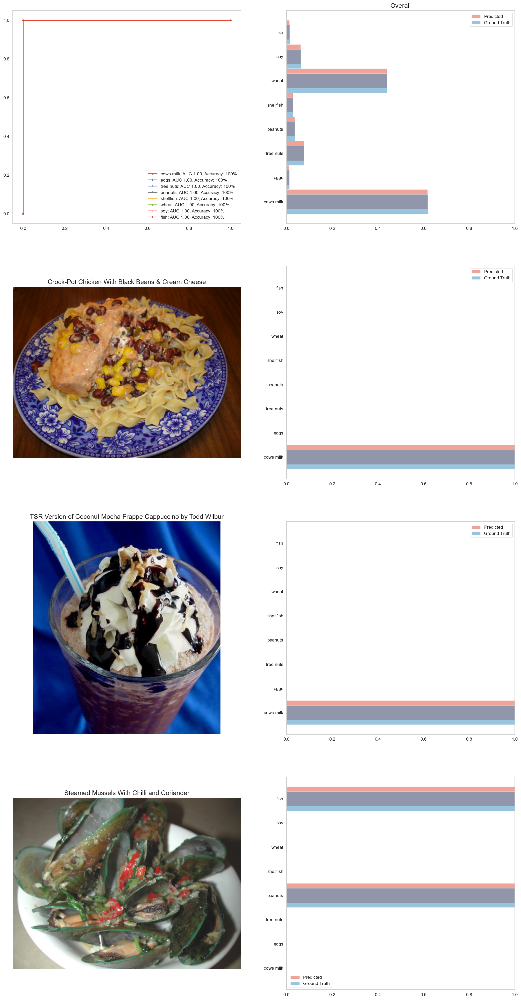

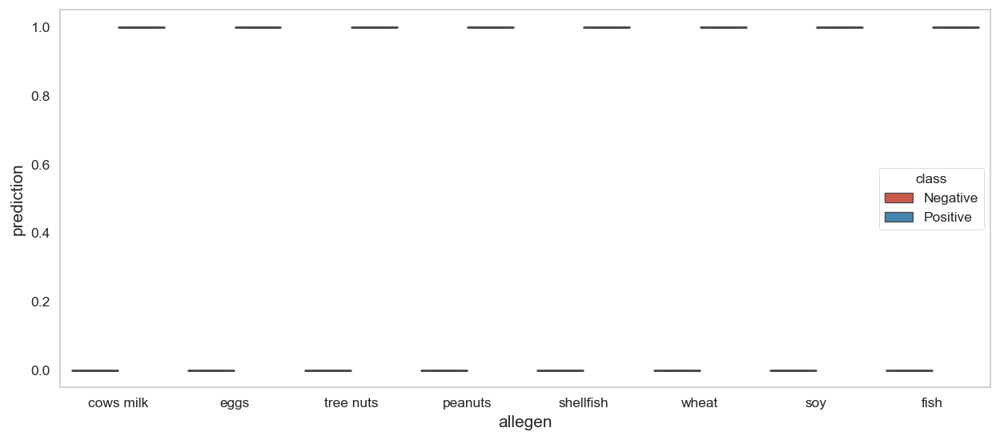

In [13]:
show_model_results(knn, use_split='train', plot_type='box');

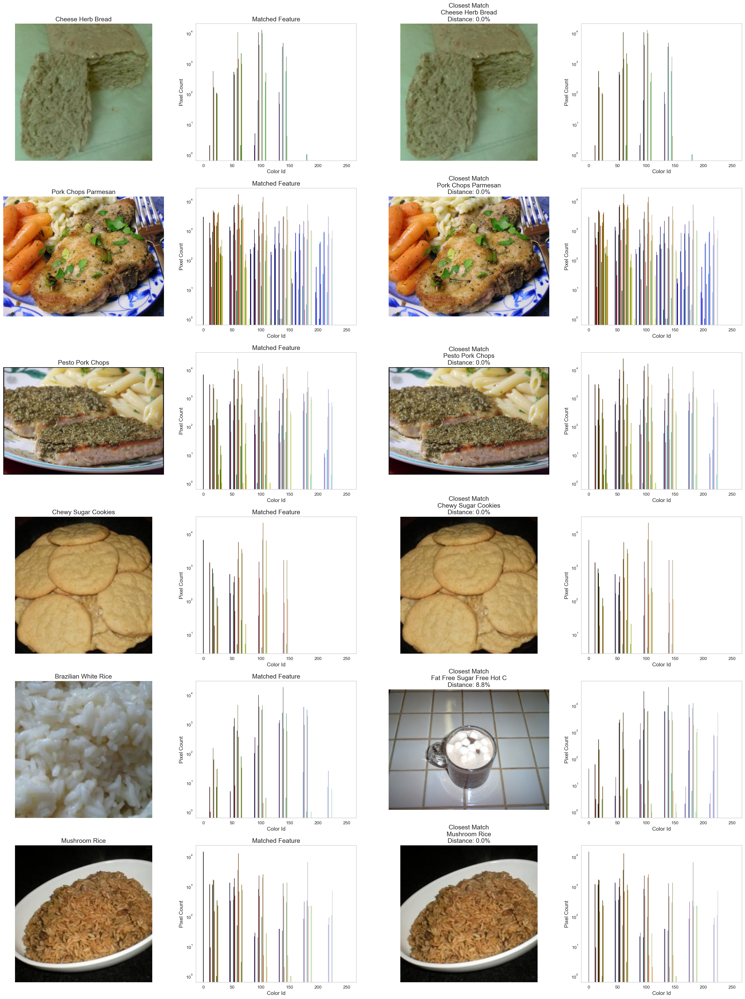

In [14]:
fig, m_axs = plt.subplots(6, 4, figsize=(30, 40))
dummy_web_image = Image.new(size=(1,1), mode='RGB').convert('P', palette='web')

for (c_ax, c_feat_ax, d_ax, d_feat_ax), (_, c_row) in zip(m_axs, 
                            alleg_df.sample(m_axs.shape[0], random_state=2018).iterrows()):
    
    query_img = Image.open(c_row['image_path'])
    idx_to_color = np.array(query_img.convert('P', palette='web').getpalette()).reshape((-1, 3))/255.0
    c_ax.imshow(query_img)
    c_ax.set_title(c_row['title'][:25])
    c_ax.axis('off')
    counts, bins = np.histogram(np.ravel(query_img.convert('P', palette='web')), 
                                bins=np.arange(256))
    
    for i in range(counts.shape[0]):
        c_feat_ax.bar(bins[i], counts[i], color=idx_to_color[i], edgecolor='k', linewidth=0.1)
    c_feat_ax.set_yscale('log')
    c_feat_ax.set_xlabel('Color Id')
    c_feat_ax.set_ylabel('Pixel Count')
    c_feat_ax.set_title('Feature Vector')
    
    dist, idx = knn.kneighbors(np.expand_dims(c_row['color_features'], 0))
    m_row = train_df.iloc[idx[0][0]]
    matched_img = Image.open(m_row['image_path'])
    
    d_ax.imshow(matched_img)
    d_ax.set_title('Closest Match\n{}\nDistance: {:2.1%}'.format(m_row['title'][:25], dist[0][0]))
    d_ax.axis('off')
    
    counts, bins = np.histogram(np.ravel(matched_img.convert('P', palette='web')), 
                                bins=np.arange(256))
    
    for i in range(counts.shape[0]):
        d_feat_ax.bar(bins[i], counts[i], color=idx_to_color[i], edgecolor='k', linewidth=0.1)
    d_feat_ax.set_yscale('log')
    d_feat_ax.set_xlabel('Color Id')
    d_feat_ax.set_ylabel('Pixel Count')
    c_feat_ax.set_title('Matched Feature')

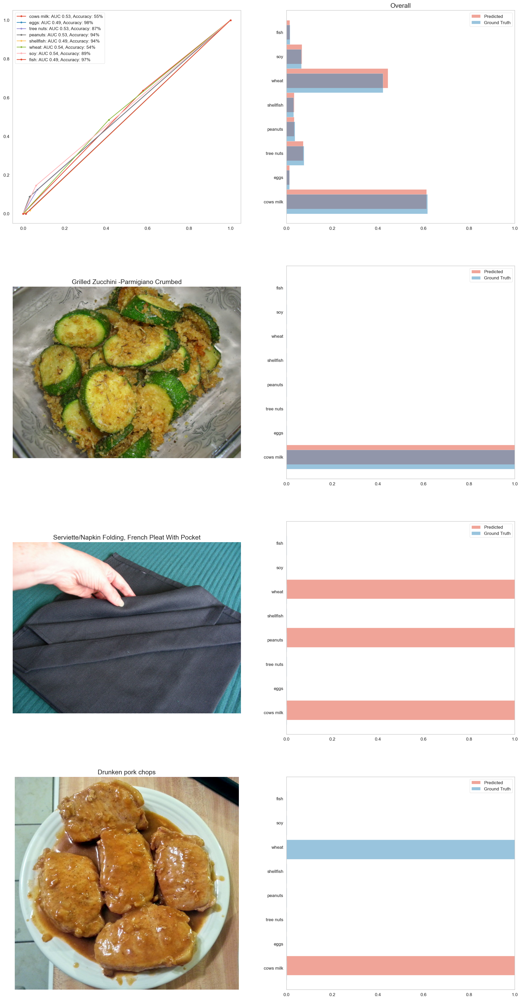

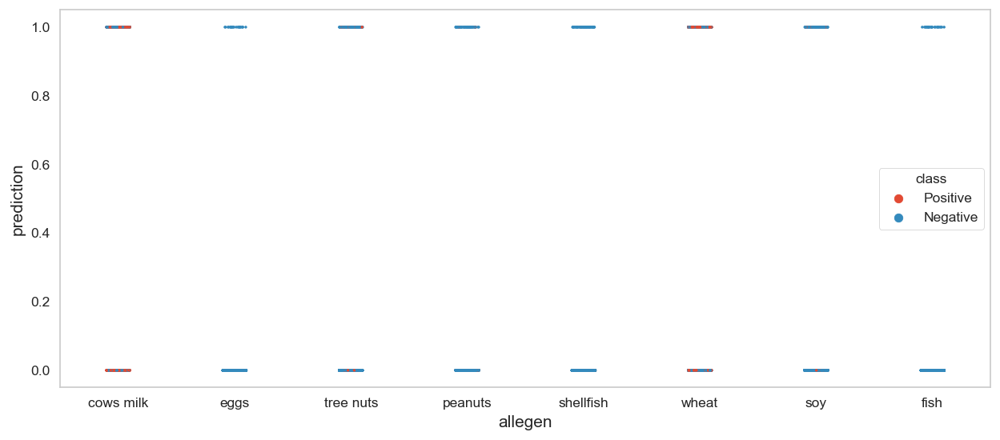

In [15]:
show_model_results(knn, use_split='valid');

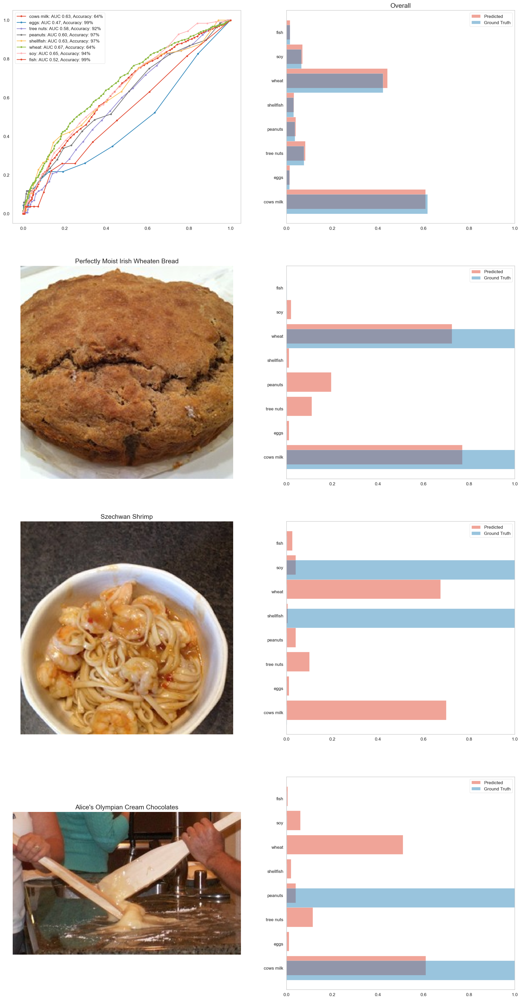

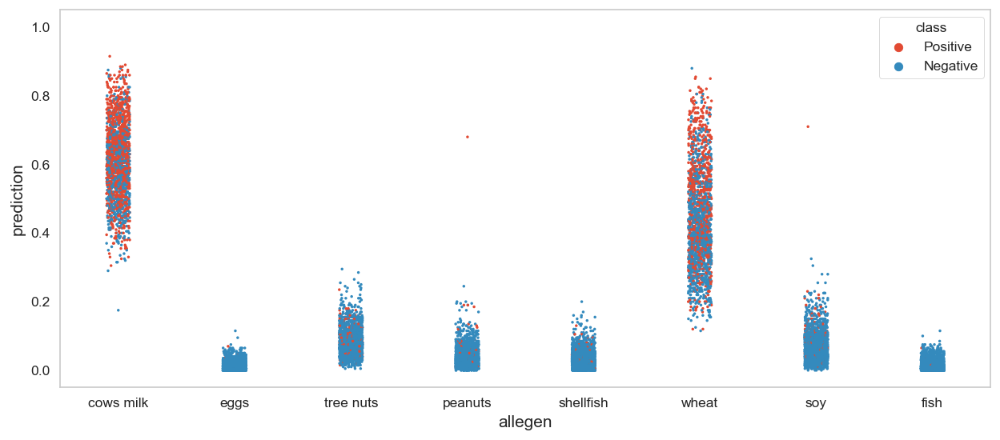

In [18]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import RandomForestRegressor
rf_pipe = make_pipeline(RobustScaler(), RandomForestRegressor(n_estimators=200))
rf_pipe.fit(train_x_vec, train_y_vec)
show_model_results(rf_pipe);

In [20]:
from xgboost import XGBRegressor
from sklearn.multioutput import MultiOutputRegressor
xg_pipe = make_pipeline(RobustScaler(), 
                        MultiOutputRegressor(XGBRegressor(objective='reg:squarederror')))
xg_pipe.fit(train_x_vec, train_y_vec)

Pipeline(steps=[('robustscaler', RobustScaler()),
                ('multioutputregressor',
                 MultiOutputRegressor(estimator=XGBRegressor(base_score=None,
                                                             booster=None,
                                                             callbacks=None,
                                                             colsample_bylevel=None,
                                                             colsample_bynode=None,
                                                             colsample_bytree=None,
                                                             early_stopping_rounds=None,
                                                             enable_categorical=False,
                                                             eval_metric=None,
                                                             feature_types=None,
                                                             gamma=None,
                                                             gpu_id=None,
                                                             grow_policy=None,
                                                             importance_type=None,
                                                             interaction_constraints=None,
                                                             learning_rate=None,
                                                             max_bin=None,
                                                             max_cat_threshold=None,
                                                             max_cat_to_onehot=None,
                                                             max_delta_step=None,
                                                             max_depth=None,
                                                             max_leaves=None,
                                                             min_child_weight=None,
                                                             missing=nan,
                                                             monotone_constraints=None,
                                                             n_estimators=100,
                                                             n_jobs=None,
                                                             num_parallel_tree=None,
                                                             predictor=None,
                                                             random_state=None, ...)))])

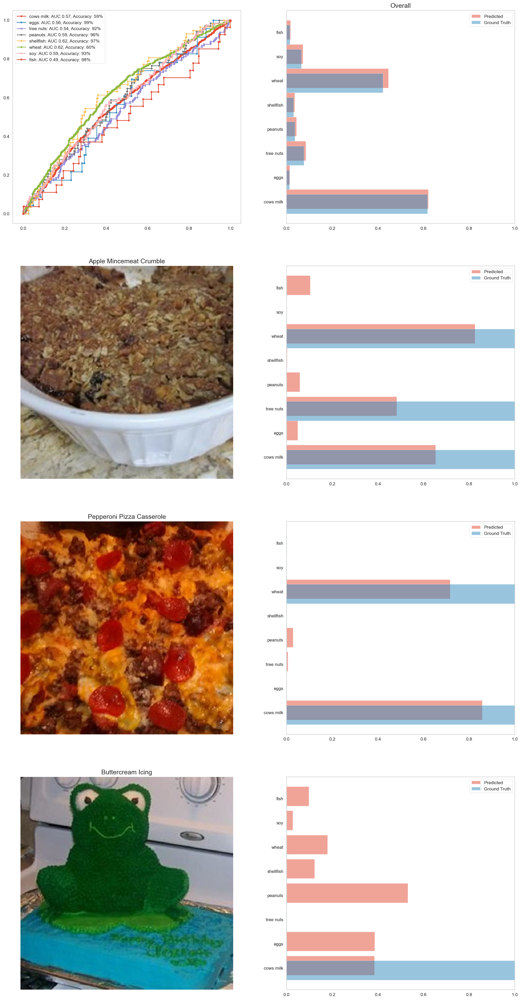

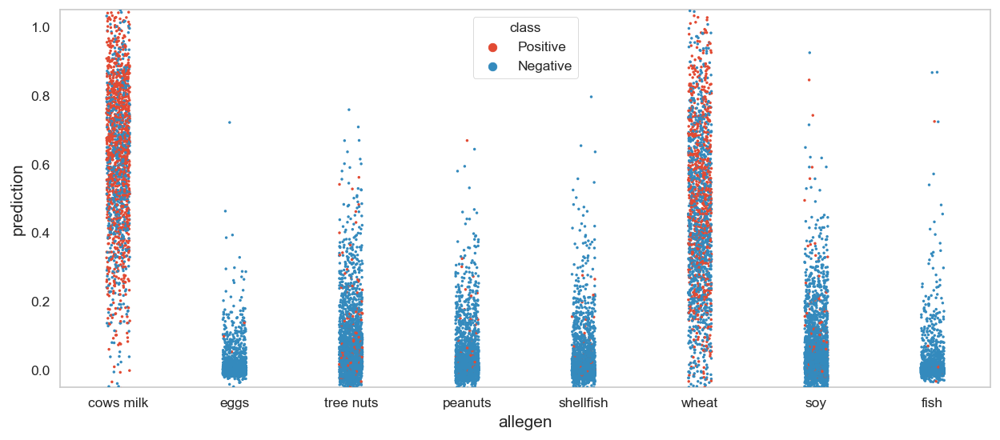

In [21]:
show_model_results(xg_pipe);

In [1]:
import tensorflow as tf
import numpy as np
import json

Using TensorFlow backend.


In [16]:
train_x1 = np.stack(train_df['color_features'].values, 0)
train_y1 = np.stack(train_df['allergy_vec'], 0)
validation_x1 = np.stack(valid_df['color_features'].values, 0)
validation_y1 = np.stack(valid_df['allergy_vec'], 0)